In [1]:
from matplotlib import pyplot as plt
import os
import numpy as np
from simulation_similarity_analysis.dataset_processing import IMG_TYPES, TIMESTEPS, DatasetProcessing, SimilarityMetric
import glob
import pandas as pd
import re
plt.rcParams['text.usetex'] = True

In [11]:
# dataset_name = "no_dose_analysis"
dataset_name= "baseline_dose_analysis"
#dataset_name = "best_dose_analysis"

dataset = DatasetProcessing("no_dose_dataset_start=350_interval=100_ndraw=8_size=(64,64)", dataset_name, jupyter=True)
parameters = {
    "cell_cycle":"Duration of the cell cycle $t_{total}$",
    "average_healthy_glucose_absorption":"Average healthy glucose absorption $\mu_{g\_healthy}$",
    "average_cancer_glucose_absorption":"Average cancer glucose absorption $\mu_{g\_cancer}$",
    "average_healthy_oxygen_consumption":"Average healthy oxygen consumption $\mu_{o\_healthy}$",
    "average_cancer_oxygen_consumption":"Average cancer oxygen consumption $\mu_{o\_cancer}$"
             }

# Principal Component Analysis (PCA)
## All variation

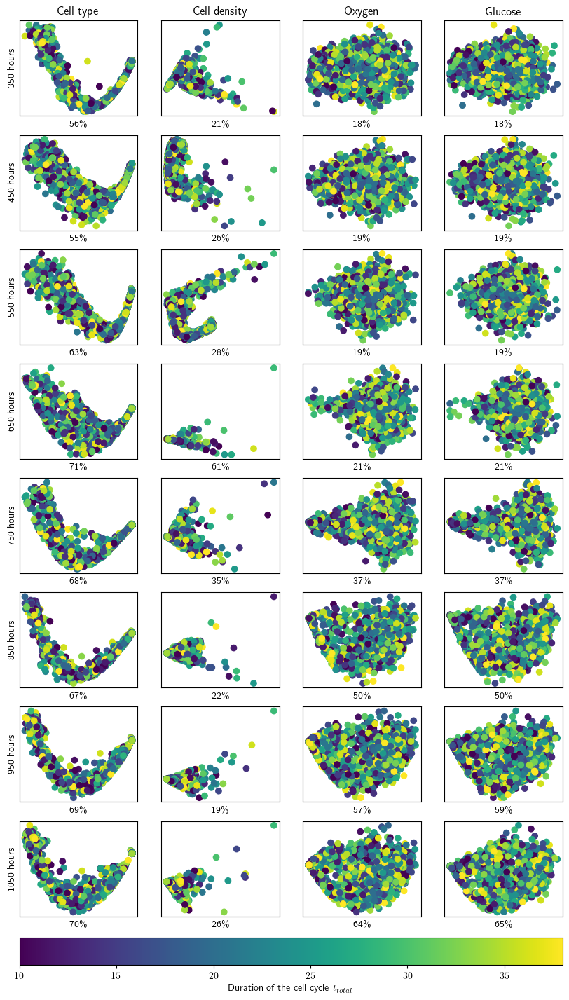

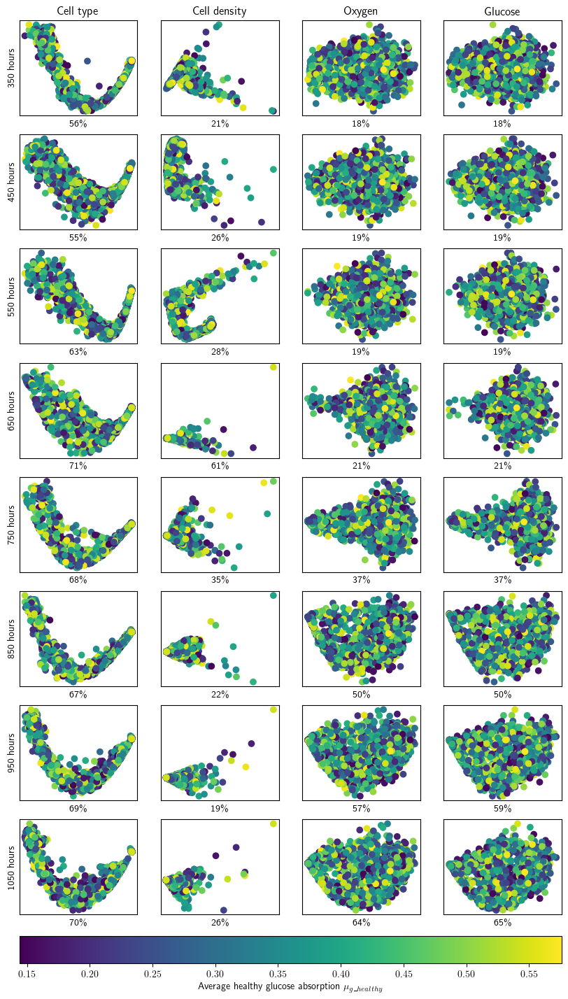

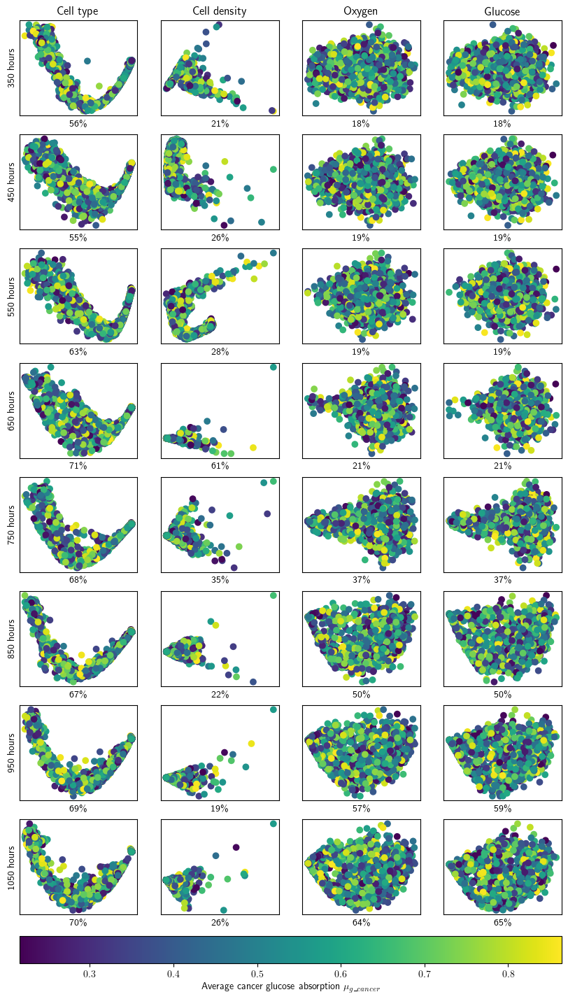

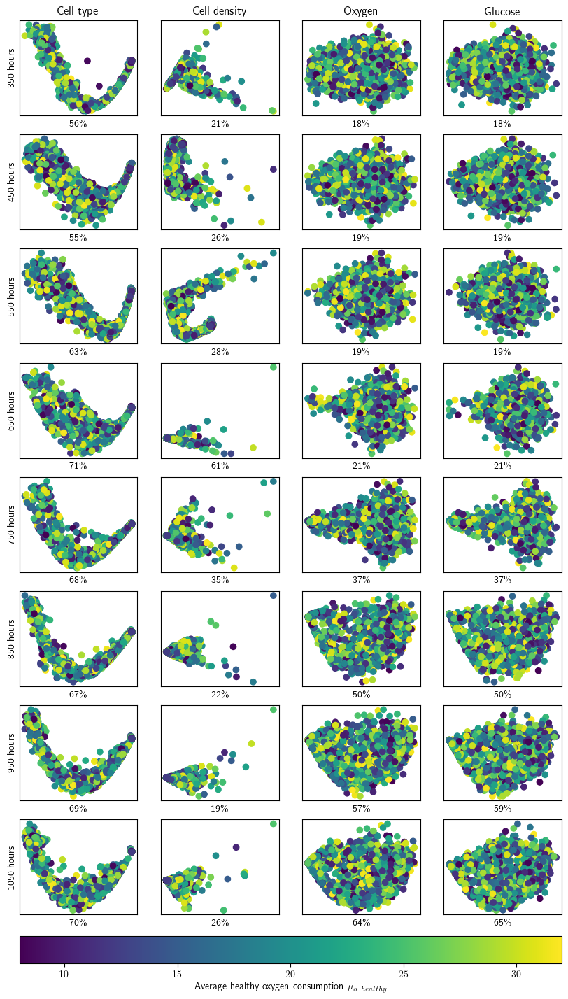

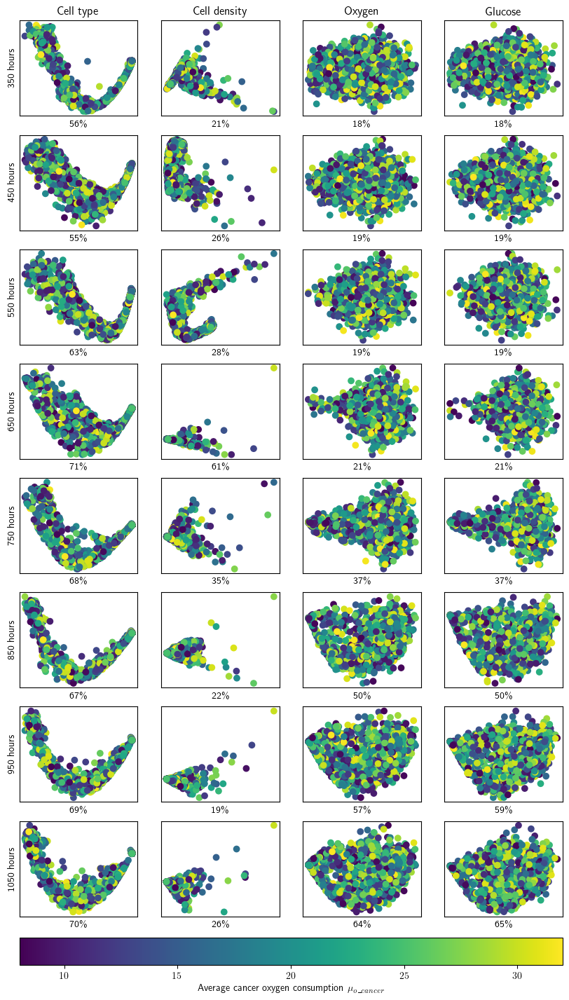

In [8]:
im=None
for param in parameters.keys():
    fig, ax = plt.subplots(8,4, figsize = (10,20))
    target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
    for i, draw in enumerate(TIMESTEPS):
        for j, image_type in enumerate(IMG_TYPES):
            file_start = os.path.join(dataset_name,"pca",f'pca_{image_type}_{draw}_vr*')
            matching_files = glob.glob(file_start)[0]
            explained_variance = float(matching_files.split('=')[1][:-4])
            pca_data = np.load(matching_files)
            im = ax[i,j].scatter(pca_data[:,0],pca_data[:,1], c=target)
            
            ax[i,j].xaxis.set_tick_params(labelbottom=False)
            ax[i,j].yaxis.set_tick_params(labelleft=False)
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            
            ax[i,j].set_xlabel(f"{int(explained_variance*100)}\%")
            
            
                
    for axes, col in zip(ax[0], ["Cell type","Cell density","Oxygen","Glucose"]):
        axes.set_title(col)
    
    for axes, row in zip(ax[:,0], range(350,1150,100)):
        axes.set_ylabel(f"{row} hours")
        
    
    cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.02, label=f"{parameters[param]}")
    plt.savefig(os.path.join(dataset_name,"pca", f'all_pca_{param}.pdf'),bbox_inches='tight')


## Combined PCA

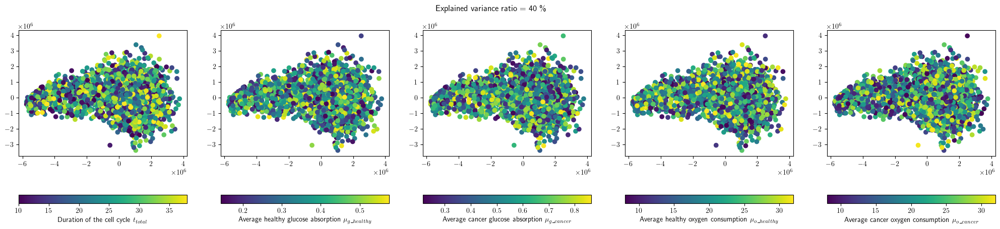

In [9]:
data = list()
draws = range(350,1150,100)

file_start = os.path.join(dataset_name,"pca",f'pca_combined_vr*')
matching_files = glob.glob(file_start)[0]
explained_variance = float(matching_files.split('=')[1][:-4])
pca_data = np.load(matching_files)

fig, ax = plt.subplots(1,5, figsize = (25,5))
for i, param in enumerate(parameters.keys()):
    target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
    im = ax[i].scatter(pca_data[:,0],pca_data[:,1], c=target)
    cbar = fig.colorbar(im, orientation='horizontal', pad=0.2, label=f"{parameters[param]}")
fig.suptitle(f"Explained variance ratio = {int(explained_variance*100)} \%")
plt.savefig(os.path.join(dataset_name,"pca", f'all_pca_combined.pdf'),bbox_inches='tight')

# Isomap
## All variation

In [ ]:
im=None
for param in parameters.keys():
    fig, ax = plt.subplots(8,4, figsize = (10,20))
    target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
    for i, draw in enumerate(TIMESTEPS):
        for j, image_type in enumerate(IMG_TYPES):
            isomap_data = np.load(os.path.join(dataset_name,"isomap",f"isomap_{image_type}_{draw}.npy"))
            im = ax[i,j].scatter(isomap_data[:,0],isomap_data[:,1], c=target)
            
            ax[i,j].xaxis.set_tick_params(labelbottom=False)
            ax[i,j].yaxis.set_tick_params(labelleft=False)
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            
            
                
    for axes, col in zip(ax[0], ["Cell type","Cell density","Oxygen","Glucose"]):
        axes.set_title(col)
    
    for axes, row in zip(ax[:,0], range(350,1150,100)):
        axes.set_ylabel(f"{row} hours")
        
    
    cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.02, label=f"{parameters[param]}")
    plt.savefig(os.path.join(dataset_name,"isomap", f'all_isomap_{param}.pdf'),bbox_inches='tight')


## Combined isomap

In [ ]:
data = list()
draws = range(350,1150,100)

isomap_data = np.load(os.path.join(dataset_name,"isomap",f"isomap_combined.npy"))

fig, ax = plt.subplots(1,5, figsize = (25,5))
for i, param in enumerate(parameters.keys()):
    target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
    im = ax[i].scatter(isomap_data[:,0],isomap_data[:,1], c=target)
    cbar = fig.colorbar(im, orientation='horizontal', pad=0.2, label=f"{parameters[param]}")
plt.savefig(os.path.join(dataset_name,"isomap", f'all_isomap_combined.pdf'),bbox_inches='tight')

# Mutual information

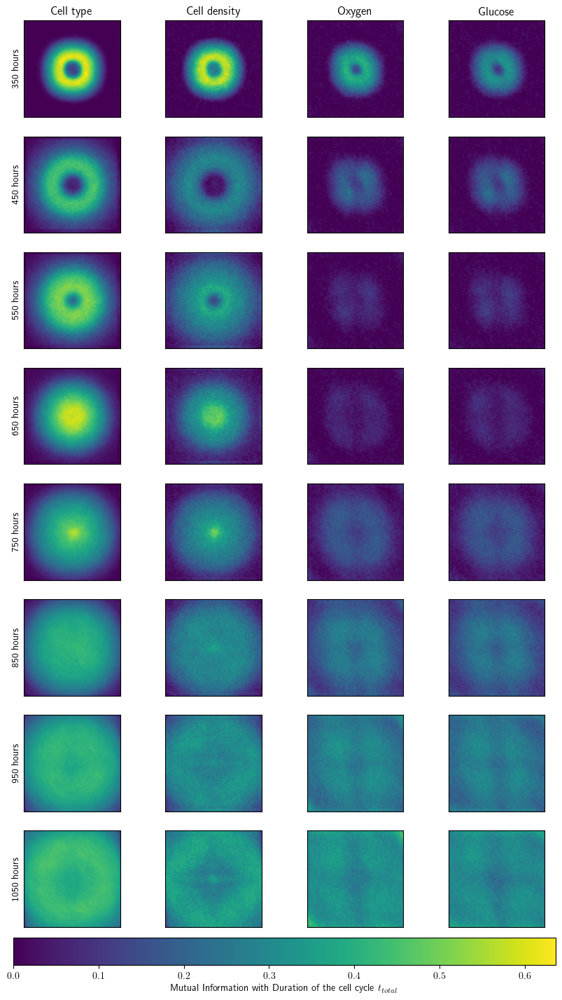

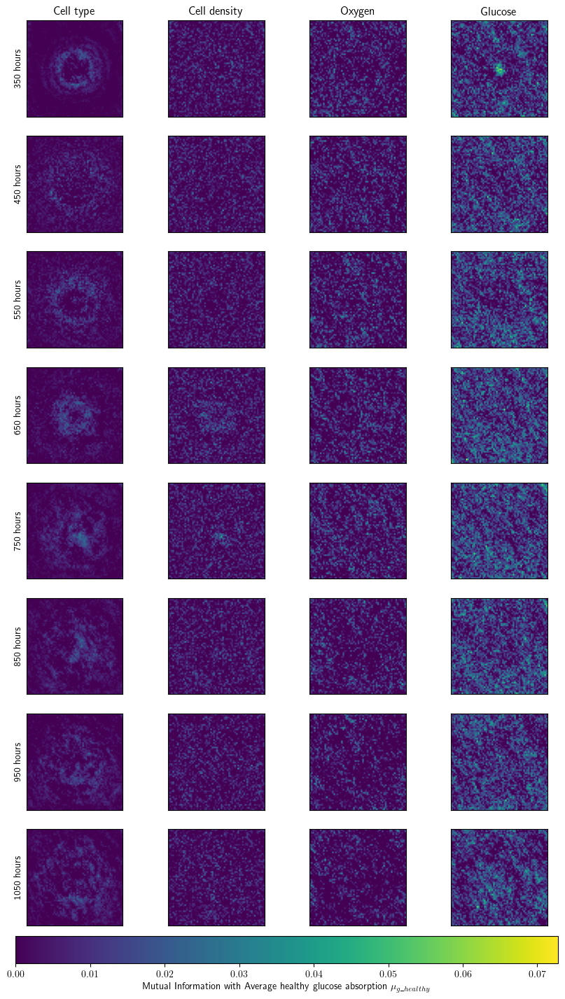

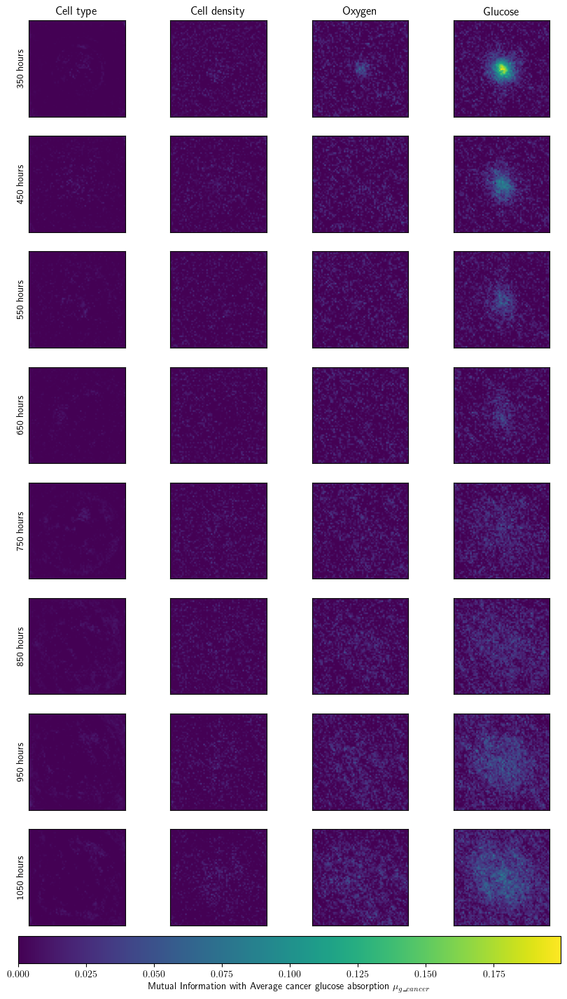

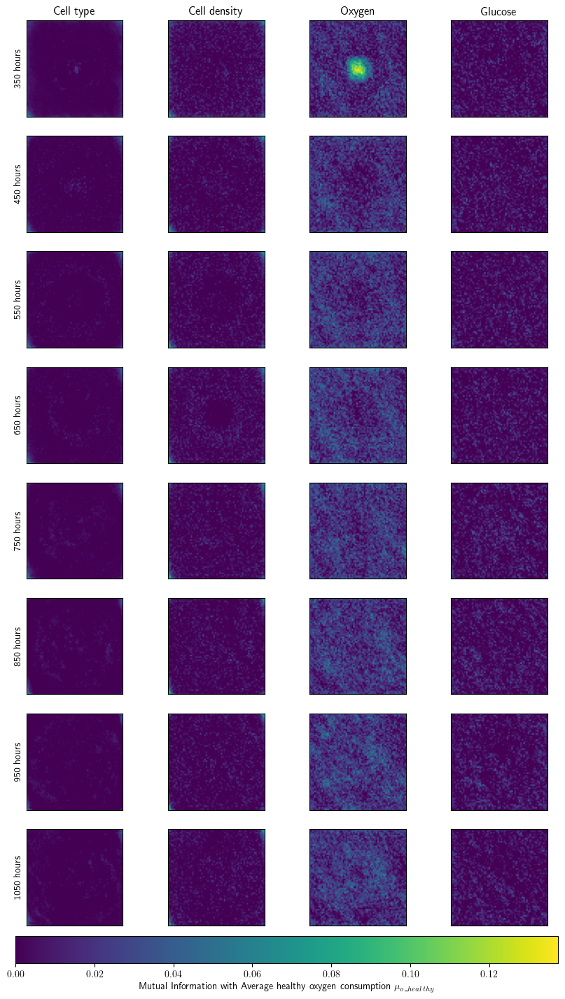

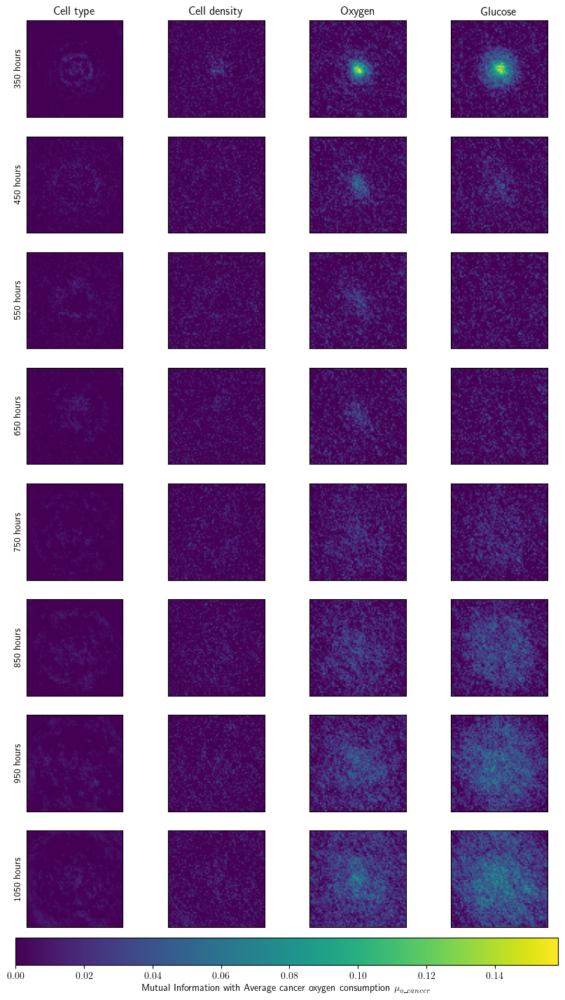

In [12]:
for param in parameters.keys():
    fig, ax = plt.subplots(8,4, figsize = (10,20))
    im = None
    mutual_information = {}
    v_min = np.inf
    v_max = -np.inf
    for i, draw in enumerate(TIMESTEPS):
        mutual_information[draw] = dict()
        for j, image_type in enumerate(IMG_TYPES):
            mutual_information[draw][image_type] = np.load(os.path.join(dataset_name,"mi",f'mi_{draw}_{image_type}_{param}.npy'))
            v_min = min(v_min, mutual_information[draw][image_type].min())
            v_max = max(v_max, mutual_information[draw][image_type].max())
    for i, draw in enumerate(TIMESTEPS):
        for j, image_type in enumerate(IMG_TYPES):
            im = ax[i,j].imshow(mutual_information[draw][image_type], vmin=v_min, vmax=v_max)
            ax[i,j].xaxis.set_tick_params(labelbottom=False)
            ax[i,j].yaxis.set_tick_params(labelleft=False)
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
    for axes, col in zip(ax[0], ["Cell type","Cell density","Oxygen","Glucose"]):
        axes.set_title(col)
    
    for axes, row in zip(ax[:,0], TIMESTEPS):
        axes.set_ylabel(f"{row} hours")
    
    cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.01, label = f"Mutual Information with {parameters[param]}")
    plt.savefig(os.path.join(dataset_name,"mi", f'all_mutual_information_{param}.pdf'),bbox_inches='tight', dpi=400)


# Choose an image similarity metric

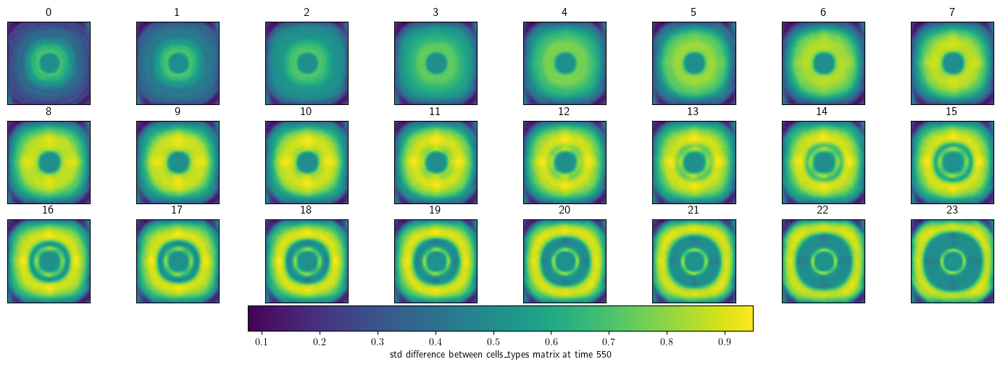

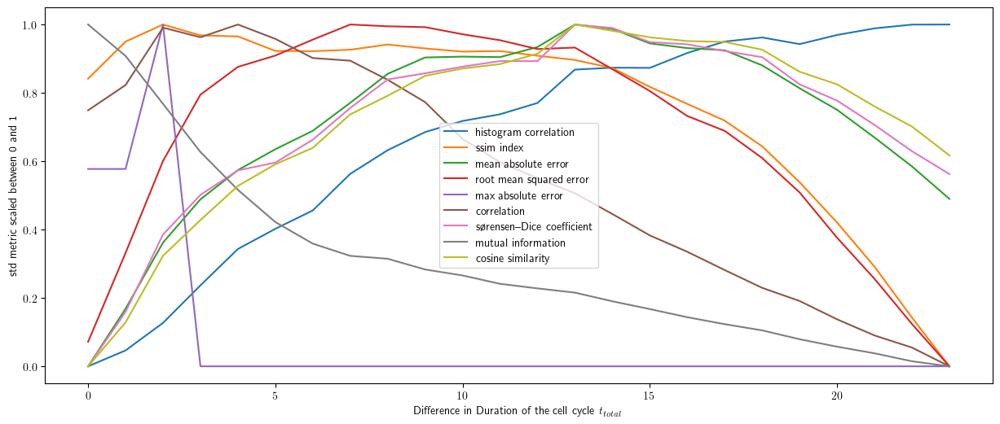

In [32]:
param = list(parameters.keys())[0]
image = "cells_types"
timestep = 550
mean_or_std = "std"
number_of_diff = 24
number_of_column = 8

# Show mean absolute difference
fig, ax = plt.subplots(3,number_of_column, figsize = (18,6))
files = [np.load(os.path.join(dataset_name,"similarity_between_matrix",f"{mean_or_std}_image absolute difference_{timestep}_{image}_{param}_{diff}.npy")) for diff in range(number_of_diff)]
v_min = np.min(files)
v_max = np.max(files)
im = None
for diff in range(number_of_diff):
    row = diff // number_of_column
    col = diff % number_of_column
    im = ax[row, col].imshow(files[diff], vmin=v_min, vmax=v_max)
    ax[row, col].set_title(f"{diff}")
    ax[row,col].xaxis.set_tick_params(labelbottom=False)
    ax[row,col].yaxis.set_tick_params(labelleft=False)
    ax[row,col].set_xticks([])
    ax[row,col].set_yticks([])

cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.01, shrink=0.5, label = f"{mean_or_std} difference between {image} matrix at time {timestep}")
plt.savefig(os.path.join(dataset_name,"similarity_between_matrix", f'{mean_or_std} difference between {image} matrix by difference in {parameters[param]} at time {timestep}.pdf'),bbox_inches='tight', dpi=400)
plt.show()

# Show metrics
fig = plt.figure(figsize = (15,6))
df = pd.read_csv(os.path.join(dataset_name,"similarity_between_matrix","scalar_similarity.csv"), index_col=0)
X = np.arange(0,number_of_diff,1)
for metric in SimilarityMetric:
    if metric != SimilarityMetric.IMAGE_ABSOLUTE_DIFFERENCE:
        Y = np.array([df.loc[(df["Metric"]==metric.__str__()) & (df["Timestep"]==timestep) & (df["Img_Type"]==image) & (df["Parameter"]==param) & (df["Difference"]==diff), "Mean_Similarity_Measure" if mean_or_std=="mean" else "Std_Similarity_Measure"] for diff in range(number_of_diff)] )
        Y_scaled= ( Y- np.min(Y) )/( np.max(Y)-np.min(Y) )
        plt.plot(X, Y_scaled, label=metric.__str__())
plt.xlabel(f"Difference in {parameters[param]}")
plt.ylabel(f"{mean_or_std} metric scaled between 0 and 1")
plt.legend()
plt.savefig(os.path.join(dataset_name,"similarity_between_matrix", f"{mean_or_std} metrics between image by difference in {param} at time {timestep} for {image} matrix.pdf"),dpi=400)